Ignacio Vellido Expósito

In [1]:
import cv2

# Función para mostrar varias imágenes en una sola ventana
import numpy as np
from matplotlib import pyplot as plt

def plot_vector_img(vim, cols=0, titles=None, suptitle=None, gray=False):
    """ Visualiza varias imágenes a la vez """
    n_images = len(vim)

    if not cols:
        cols = 7 if len(vim) >= 7 else len(vim)

    if titles is None:
        titles = ['' for i in range(1, n_images+1)]

    if suptitle is None:
          suptitle = ''

    fig = plt.figure()
    for n, (image, title) in enumerate(zip(vim, titles)):
        a = fig.add_subplot(int(np.ceil(n_images/float(cols))), cols, n+1)          
        plt.imshow(image, "gray" if gray else None)        

        a.set_title(title)        
        a.axis('off')

    fig.suptitle(suptitle)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    fig.subplots_adjust(bottom=0)

    plt.show()

Los objetos presente en una imagen se caracterizan por tener asociado un conjunto de escalas,  en las que es posible identificar algunos o todos los objetos presentes.  Esta característica es útil para establecer el grado de emborronamiento admisible por una imagen para visualizar objetos presentes ellos.

Usando esta característica, suponed que tenemos una imagen con ruido gaussiano, y queremos obtener los sigmas asociados al filtro gausiana para eliminar el ruido presente. Asi por ejemplo suponed que tenemos las siguientes imágenes:

Para averiguar los sigmas relevantes, fijamos un sigma, aplicamos el  filtro de Canny (que usa una primera deivada de una gausiana) y contaremos cuantos puntos fronteras aparecen. A continuación variamos el sigma y volvemos aplicar el filtro de Canny. De forma que obtenemos una señal1d con eje x variando en sigma y eje y el numero de puntos frontera asociado  (sigma, #ptos_frontera). Sobre esta señal obtenemos los máximos cambios en el número de puntos frontera (usando p.e: segunda derivada y buscando los cruces por cero de una señal 1d). Sobre estos máximos aplicamos sobre la imagen con ruido un filtro gausiana con el sigma correspondiente. Pensad que el tamaño de la ventana del filtro gausiana tiene que estar relacionado con el sigma (por ejemplo el tamaño de la ventana puede obtenerse como 3*sigma +1).

Asi por ejemplo para la imagen con ruido anterior y buscando máximos obtenemos:

Aplicar este algoritmo sobre diferentes imágenes.
Pensad, en vez del número de puntos frontera, en otro tipo de característica, por ejemplo: entropía del entorno del punto frontera, varianza en el entorno del punto fronteras, etc. Para ello una vez que obtienes el punto frontera, en esa posición sobre la imagen emborronada concreta obtienes p.e la varianza en el entorno del punto, así para cada punto frontera.

In [ ]:
# Trabajo 2: Sobre una imagen decir las escalas significativas (las escalas donde empiezan a aparecer y desaperecer objetos). Para ello se le va a añadir ruido gaussiano (convolucionando). 

# Para sigma = 1 se aplica Canny -> Ver cuantos puntos de aristas se obtienen.
# Probar con otros sigmas y ver con cuáles cambian.

# Documentación y código
# Proponer otro método

In [2]:
# https://stackoverflow.com/questions/28931265/calculating-variance-of-an-image-python-efficiently/36266187#36266187
def winVar(img, wlen):
  wmean, wsqrmean = (cv2.boxFilter(x, -1, (wlen, wlen),
    borderType=cv2.BORDER_REFLECT) for x in (img, img*img))

  return wsqrmean - wmean*wmean

In [29]:
def canny(img, sigma=0):
    mask_size = 3
    if sigma != 0:
        mask_size = int(3*sigma)
        mask_size = mask_size + 1 if not mask_size % 2 else mask_size

    img_gau = cv2.GaussianBlur(img, (mask_size,mask_size), sigma)

    return cv2.Canny(img_gau, 50, 100, 3) 

# ----------------------------------------------------------------------

def best_scale(img, variance=False):
    sigmas = np.linspace(0.1, 2.5, 25)

    # Calculamos el número de puntos a diferentes niveles de sigma
    points = []
    sigmaAndPoints = []
    for sigma in sigmas:
        img_canny = canny(img, sigma)
        
        nonzero = 0
        if variance:
            _, aux = cv2.threshold(img_canny, 128, 1, cv2.THRESH_BINARY)
            variance = winVar(aux, 5)
            nonzero = variance.sum()
        else:
            nonzero = np.count_nonzero(img_canny)

        points.append(nonzero)
        sigmaAndPoints.append((sigma, nonzero))

    points = np.array(points)
    plt.plot(*zip(*sigmaAndPoints))
    plt.show()

    # --------------------------------------
    # Buscamos los máximos cambios en los puntos

    # Calculando segunda derivada
    ddf = np.gradient(np.gradient(points))

    # Cogemos los cruces por cero
    max = np.argwhere(np.diff(np.sign(ddf))).flatten()

    # Mostramos los puntos en una gráfica
    plt.plot(sigmas, ddf)
    plt.plot(np.arange(0, 4))
    plt.plot(sigmas[max], ddf[max], 'ro')
    plt.show()

    # Aplicamos gaussiana con los sigmas encontrados a la imagen
    vim = []
    titles = []
    for sigma in sigmas[max]:
        mask_size = int(3*sigma)
        mask_size = mask_size + 1 if not mask_size % 2 else mask_size

        aux = cv2.GaussianBlur(img, (mask_size,mask_size), sigma)

        vim.append(aux)
        titles.append("Sigma: {}".format(sigma))

    plot_vector_img(vim, titles=titles, gray=True)

In [21]:
# VARIANZA DEL PUNTO FRONTERA ??
# CÓMO GENERO EL VECTOR 1D ?

x = winVar(canny(img, 2), 5)
x.sum()

5585346

Img shape: (512, 512)


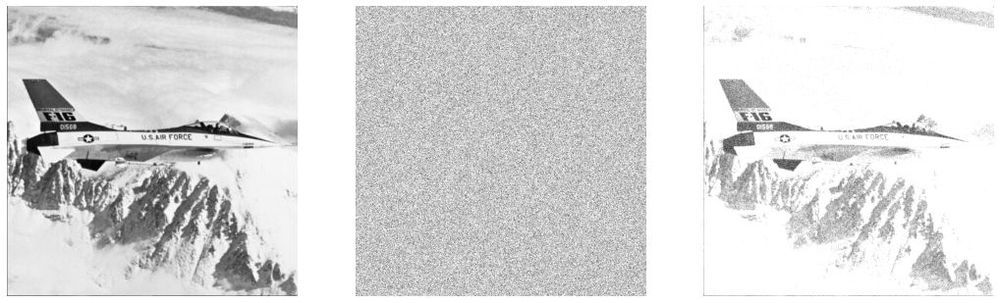

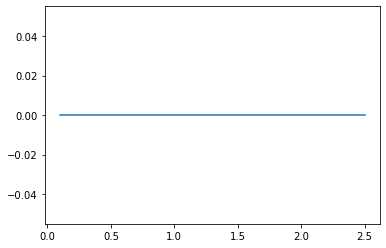

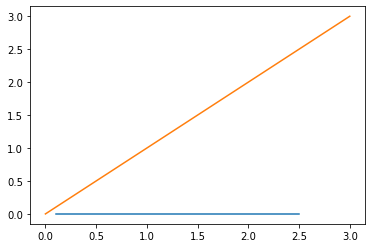

<Figure size 0x0 with 0 Axes>

In [30]:
org = cv2.imread("10.pgm", 0)

# Añadirle ruido gaussiano
noise = np.zeros((org.shape[0], org.shape[1]), dtype=np.uint8)
cv2.randn(noise,200,50)
img = cv2.addWeighted(org, 1, noise, 0.5, 1)

print("Img shape: {}".format(img.shape))
plot_vector_img([org, noise, img], gray=True)

best_scale(img, True)

Img shape: (512, 512)


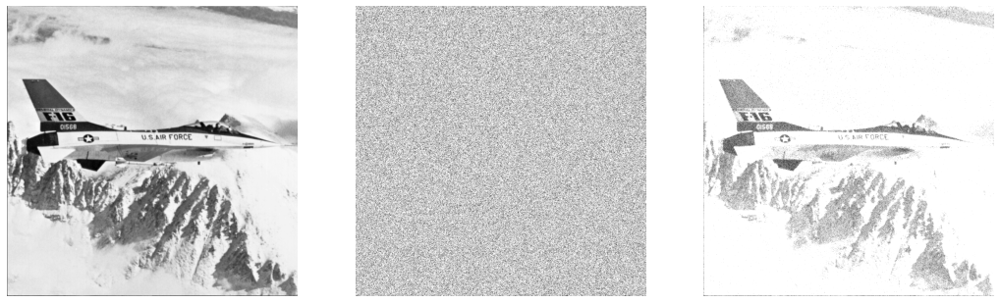

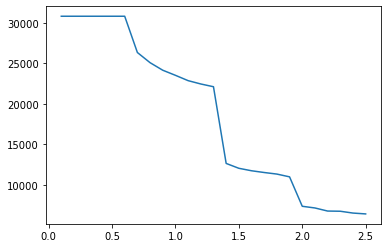

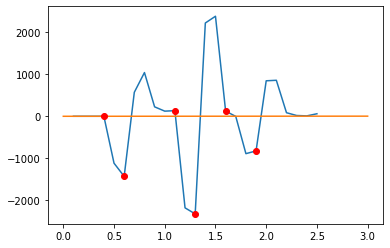

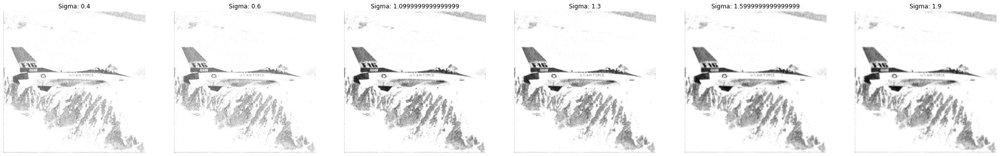

In [134]:
org = cv2.imread("10.pgm", 0)

# Añadirle ruido gaussiano
noise = np.zeros((org.shape[0], org.shape[1]), dtype=np.uint8)
cv2.randn(noise,200,50)
img = cv2.addWeighted(org, 1, noise, 0.5, 1)

print("Img shape: {}".format(img.shape))
plot_vector_img([org, noise, img], gray=True)

best_scale(img)

Img shape: (512, 512)


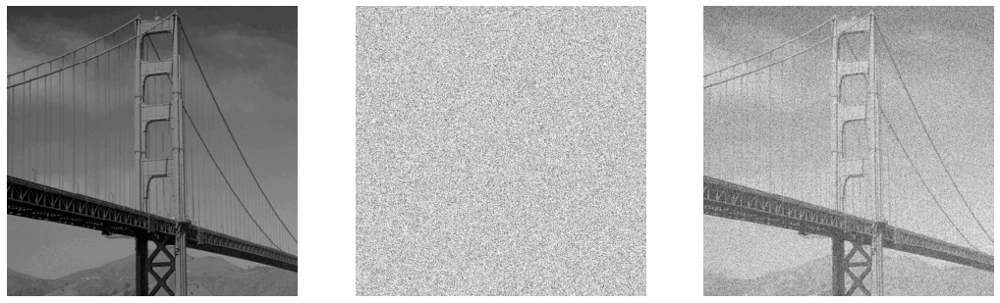

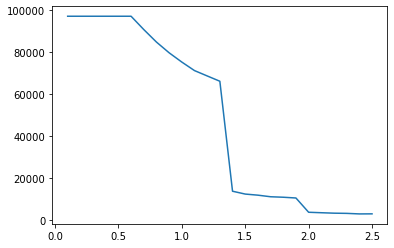

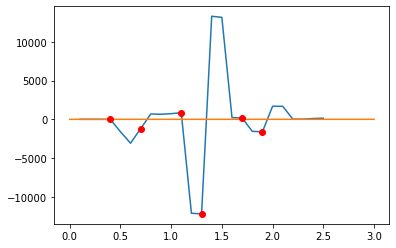

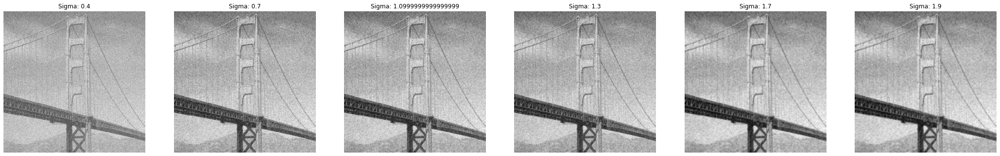

In [135]:
org = cv2.imread("25.pgm", 0)

# Añadirle ruido gaussiano
noise = np.zeros((org.shape[0], org.shape[1]), dtype=np.uint8)
cv2.randn(noise,200,50)
img = cv2.addWeighted(org, 1, noise, 0.5, 1)

print("Img shape: {}".format(img.shape))
plot_vector_img([org, noise, img], gray=True)

best_scale(img)

Img shape: (512, 512)


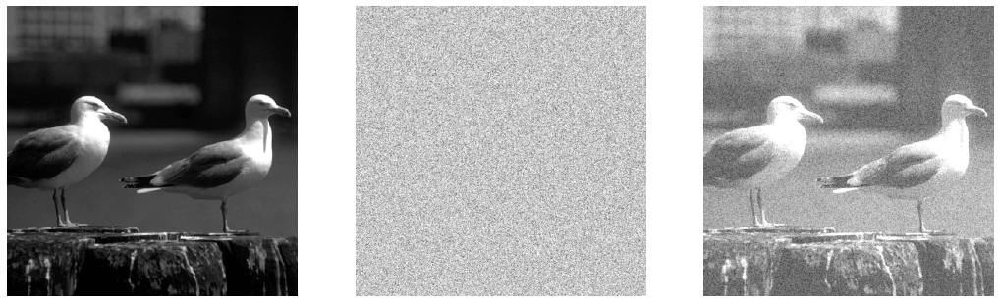

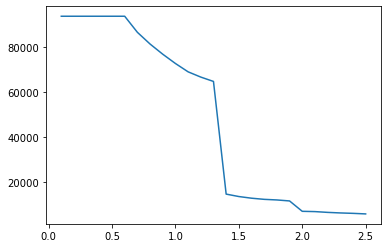

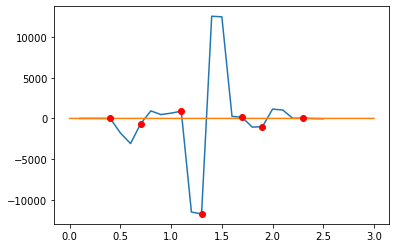

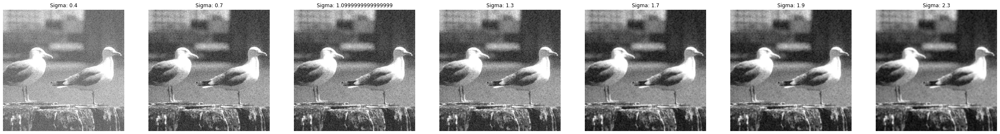

In [136]:
org = cv2.imread("27.pgm", 0)

# Añadirle ruido gaussiano
noise = np.zeros((org.shape[0], org.shape[1]), dtype=np.uint8)
cv2.randn(noise,200,50)
img = cv2.addWeighted(org, 1, noise, 0.5, 1)

print("Img shape: {}".format(img.shape))
plot_vector_img([org, noise, img], gray=True)

best_scale(img)

Img shape: (512, 512)


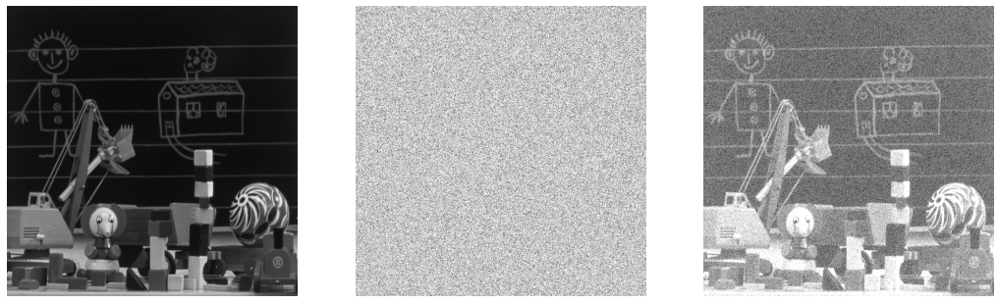

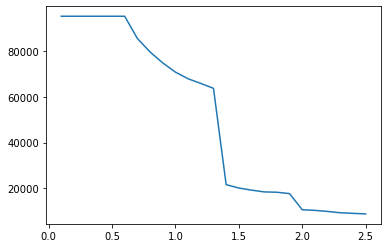

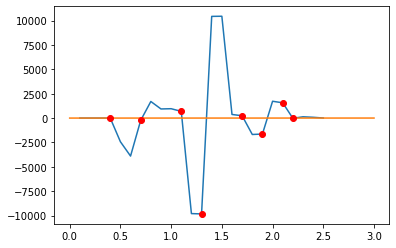

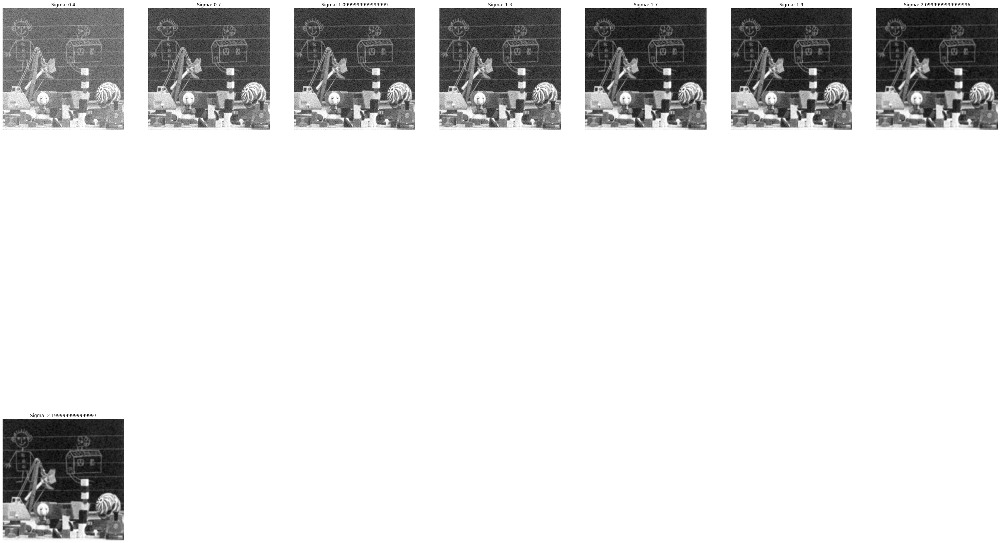

In [137]:
org = cv2.imread("65.pgm", 0)

# Añadirle ruido gaussiano
noise = np.zeros((org.shape[0], org.shape[1]), dtype=np.uint8)
cv2.randn(noise,200,50)
img = cv2.addWeighted(org, 1, noise, 0.5, 1)

print("Img shape: {}".format(img.shape))
plot_vector_img([org, noise, img], gray=True)

best_scale(img)

Img shape: (512, 512)


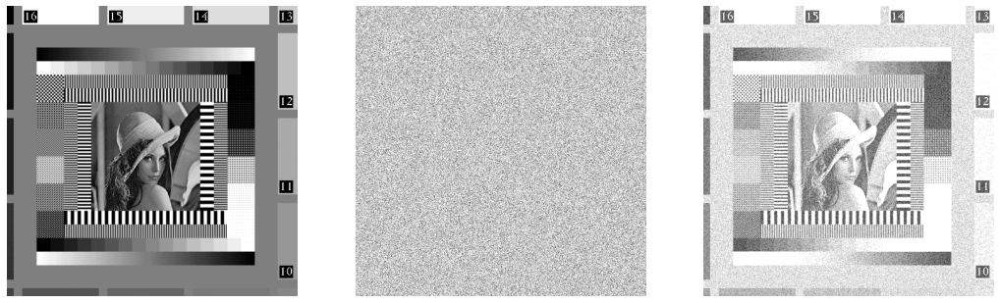

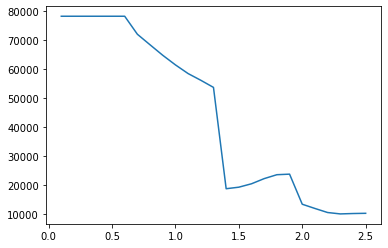

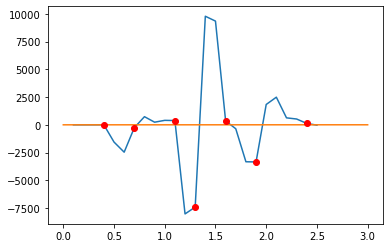

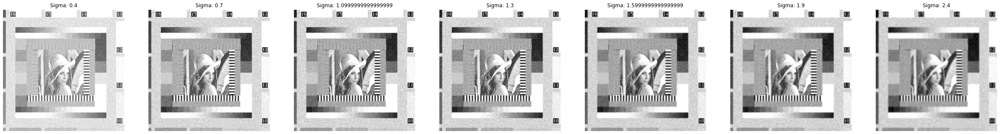

In [138]:
org = cv2.imread("92.pgm", 0)

# Añadirle ruido gaussiano
noise = np.zeros((org.shape[0], org.shape[1]), dtype=np.uint8)
cv2.randn(noise,200,50)
img = cv2.addWeighted(org, 1, noise, 0.5, 1)

print("Img shape: {}".format(img.shape))
plot_vector_img([org, noise, img], gray=True)

best_scale(img)